# Task - 2


## **Task has been mentioned at the end of this notebook**  

Read this notebook to understand the solutions to `Task - 1`



## 1. Basic Pandas Operations

In [106]:
# Import all the required Libraries

import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

In [107]:
# Read the dataset and display the head. You will get the output as mentioned below

df=pd.read_csv('train.csv')
df.head()

,Unnamed: 0,ID,City_Code,Region_Code,Accomodation_Type,Reco_Insurance_Type,Upper_Age,Lower_Age,Is_Spouse,Health Indicator,Holding_Policy_Duration,Holding_Policy_Type,Reco_Policy_Cat,Reco_Policy_Premium,Response
0,27385,27386,C3,64,Owned,Individual,36,36,No,X1,14+,2.0,16,13320.0,0
1,33499,33500,C3,2955,Owned,Individual,66,66,No,X6,10,1.0,19,16152.0,0
2,7997,7998,C1,1542,Rented,Individual,24,24,No,NaN,3,1.0,16,7310.0,0
3,33032,33033,C26,772,Rented,Individual,75,75,No,X1,1,3.0,16,15792.0,0
4,30516,30517,C2,1510,Owned,Joint,59,58,Yes,X1,14+,4.0,17,23673.0,0


In [108]:
# Check the shape of the dataframe

df.shape

(10000, 15)

In [109]:
# On the dataframe apply info() function and observe the Dtypes and Missing Values

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 15 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Unnamed: 0               10000 non-null  int64  
 1   ID                       10000 non-null  int64  
 2   City_Code                10000 non-null  object 
 3   Region_Code              10000 non-null  int64  
 4   Accomodation_Type        10000 non-null  object 
 5   Reco_Insurance_Type      10000 non-null  object 
 6   Upper_Age                10000 non-null  int64  
 7   Lower_Age                10000 non-null  int64  
 8   Is_Spouse                10000 non-null  object 
 9   Health Indicator         7671 non-null   object 
 10  Holding_Policy_Duration  5946 non-null   object 
 11  Holding_Policy_Type      5946 non-null   float64
 12  Reco_Policy_Cat          10000 non-null  int64  
 13  Reco_Policy_Premium      10000 non-null  float64
 14  Response               

## 2. Cleaning the Data

In [110]:
# Impute the Null values in Health Indicator, Holding_Policy_Duration and Holding_Policy_Type

#df['Health Indicator'].fillna(df['Health Indicator'].mode()[0],axis=0,inplace=True)
#df['Holding_Policy_Duration'].fillna(df['Holding_Policy_Duration'].mode()[0],axis=0,inplace=True)
#df['Holding_Policy_Type'].fillna(df['Holding_Policy_Type'].mode()[0],axis=0,inplace=True)
df.fillna(axis=0,method='bfill',inplace=True)

df.isnull().sum()

Unnamed: 0                 0
ID                         0
City_Code                  0
Region_Code                0
Accomodation_Type          0
Reco_Insurance_Type        0
Upper_Age                  0
Lower_Age                  0
Is_Spouse                  0
Health Indicator           0
Holding_Policy_Duration    0
Holding_Policy_Type        0
Reco_Policy_Cat            0
Reco_Policy_Premium        0
Response                   0
dtype: int64

In [111]:
# Check again Holding_Policy_Duration is in object column convert that into int

df['Holding_Policy_Duration']=df['Holding_Policy_Duration'].apply(lambda x: str(15) if x=='14+' else x)
df['Holding_Policy_Duration']=pd.to_numeric(df['Holding_Policy_Duration'])
df['Holding_Policy_Duration'].dtype

dtype('int64')

In [112]:
# Observe that ['Accomodation_Type','Reco_Insurance_Type','Is_Spouse'] 
# above these Object columns have two values - Yes and No


df[['Accomodation_Type','Reco_Insurance_Type','Is_Spouse']].nunique()

Accomodation_Type      2
Reco_Insurance_Type    2
Is_Spouse              2
dtype: int64

In [113]:
# Converting all the Yes to 1 and No to 0. 
# Write a for loop to iterate over the list given above
# For each feature use pandas 'apply()' to convert all the 'Yes' to 1 and 'No' to 0


df['Accomodation_Type']=df['Accomodation_Type'].apply(lambda x:1 if x=='Owned' else 0)
df['Reco_Insurance_Type']=df['Reco_Insurance_Type'].apply(lambda x:1 if x=='Individual' else 0)
df['Is_Spouse']=df['Is_Spouse'].apply(lambda x:1 if x=='Yes' else 0)

In [114]:
# Now again having a look at all those columns to see if everything went well

# Observe that all those columns are now converted from Object to Int64

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 15 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Unnamed: 0               10000 non-null  int64  
 1   ID                       10000 non-null  int64  
 2   City_Code                10000 non-null  object 
 3   Region_Code              10000 non-null  int64  
 4   Accomodation_Type        10000 non-null  int64  
 5   Reco_Insurance_Type      10000 non-null  int64  
 6   Upper_Age                10000 non-null  int64  
 7   Lower_Age                10000 non-null  int64  
 8   Is_Spouse                10000 non-null  int64  
 9   Health Indicator         10000 non-null  object 
 10  Holding_Policy_Duration  10000 non-null  int64  
 11  Holding_Policy_Type      10000 non-null  float64
 12  Reco_Policy_Cat          10000 non-null  int64  
 13  Reco_Policy_Premium      10000 non-null  float64
 14  Response               

In [115]:
# Checking all the Object Dtypes - Here, these columns have more than 2 categories

df[['City_Code','Health Indicator']].nunique()

City_Code           36
Health Indicator     9
dtype: int64

In [116]:
# Lets just try to see what is happening Response. Check the output.

df['Response']

0       0
1       0
2       0
3       0
4       0
5       0
6       0
7       0
8       0
9       1
10      0
11      0
12      1
13      0
14      0
15      0
16      0
17      0
18      0
19      0
20      0
21      1
22      1
23      0
24      0
25      0
26      0
27      0
28      0
29      0
30      0
31      0
32      0
33      0
34      1
35      0
36      0
37      0
38      0
39      1
40      1
41      1
42      1
43      0
44      0
45      0
46      0
47      0
48      0
49      0
50      0
51      0
52      0
53      0
54      0
55      0
56      1
57      0
58      0
59      0
60      0
61      0
62      0
63      0
64      0
65      0
66      0
67      0
68      0
69      0
70      0
71      0
72      1
73      0
74      0
75      1
76      0
77      0
78      0
79      1
80      0
81      1
82      0
83      0
84      0
85      1
86      0
87      1
88      0
89      0
90      1
91      0
92      0
93      0
94      0
95      1
96      0
97      0
98      0
99      1


In [117]:
# Dropping unknown column

# Write the code here to drop unknown column and check dataframe shape


df.drop('Unnamed: 0',axis=1,inplace=True)

df.shape

(10000, 14)

In [118]:
# Getting all the Object Dtypes

df.select_dtypes(include='object').columns

Index(['City_Code', 'Health Indicator'], dtype='object')

In [119]:
# Encoding the categorical features



# column names are (annoyingly) lost after OneHotEncoding
# (i.e. the dataframe is converted to a numpy ndarray)

# Write the code here to use 'encoder' to convert all the categorical columns to numerical representations
# Take extra care to convert encoded numpy array to dataframe and call that data fram 'df_encoded'

from sklearn.preprocessing import OneHotEncoder

OHE=OneHotEncoder(handle_unknown='ignore')
one_hot_encoded=OHE.fit_transform(df[['Health Indicator']])

df_encoded=pd.DataFrame(one_hot_encoded.toarray(),columns=sorted(df['Health Indicator'].unique().tolist()))

In [120]:
# Concatinating the original data frame and onehot encoded dataframe

final_df=df.join(df_encoded)

In [121]:
# Drop all the unwanted columns.


# Because we have already encoded them and added to main dataframe


final_df.drop(['ID','Health Indicator','X9'],axis=1,inplace=True)

In [122]:
final_df

,City_Code,Region_Code,Accomodation_Type,Reco_Insurance_Type,Upper_Age,Lower_Age,Is_Spouse,Holding_Policy_Duration,Holding_Policy_Type,Reco_Policy_Cat,Reco_Policy_Premium,Response,X1,X2,X3,X4,X5,X6,X7,X8
0,C3,64,1,1,36,36,0,15,2.0,16,13320.0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,C3,2955,1,1,66,66,0,10,1.0,19,16152.0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,C1,1542,0,1,24,24,0,3,1.0,16,7310.0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,C26,772,0,1,75,75,0,1,3.0,16,15792.0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,C2,1510,1,0,59,58,1,15,4.0,17,23673.0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,C26,452,1,1,26,26,0,3,1.0,21,13176.0,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
6,C17,4001,0,1,20,20,0,1,3.0,19,6880.0,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
7,C4,1362,0,1,55,55,0,1,3.0,9,14080.0,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
8,C2,1847,0,1,27,27,0,1,3.0,18,8946.0,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
9,C2,3377,0,1,30,30,0,7,3.0,13,7572.0,1,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


## Perform Exploratory Data Analysis

**To Do:**
1. Perform Univaraite Analysis (Basic pandas statistical description)
2. Perform Bivaraite Analysis (Pandas Cross Tabs)
3. Visualisations - 
    * Univariate - Histograms, boxplot, PDFs, countplot, etc
    * Bivariate - Scatterplot, Boxplots, Pairplot, etc
4. Write proper observations after each plot
5. At the end of the notebook, summarize it with all the best observations you got.

### City Code
#### Lets see the number of cities and see how many customers are there

In [123]:
print('no of cities in the dataframe : ',final_df['City_Code'].nunique())
print()
final_df['City_Code'].value_counts()

no of cities in the dataframe :  36



C1     1796
C2     1505
C3      966
C4      727
C9      428
C7      390
C8      371
C6      361
C10     335
C5      264
C15     239
C11     231
C16     219
C17     211
C13     193
C20     179
C12     168
C19     168
C14     153
C21     136
C24     129
C18     127
C23     123
C22     102
C26      89
C29      71
C25      66
C27      57
C33      54
C28      47
C32      39
C34      25
C36      12
C30      12
C31       4
C35       3
Name: City_Code, dtype: int64

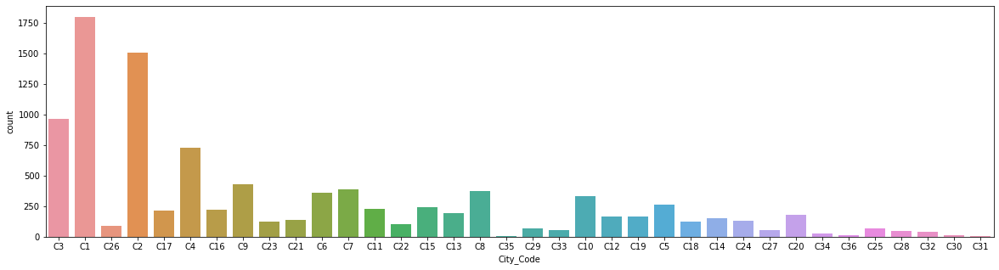

In [124]:
plt.figure(figsize=(20,5))
sns.countplot(final_df['City_Code'])
plt.show()

#### Let's see city-wise customers interests in recommended policy

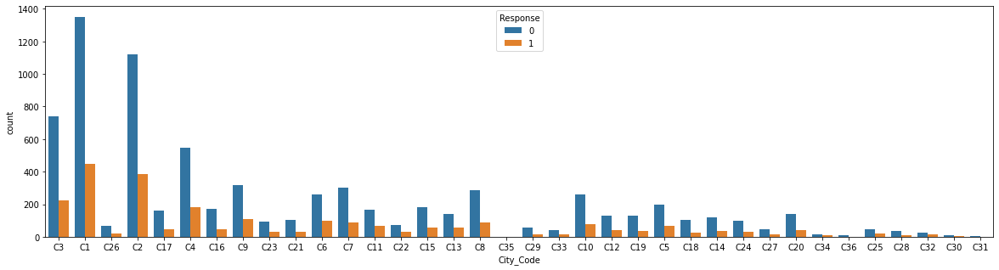

In [125]:
plt.figure(figsize=(20,5))
sns.countplot(final_df['City_Code'],hue=final_df['Response'])
plt.show()

### Region Code
#### Let's see the number of regions and region-wise customer interests in recommended policy.

In [126]:
print('no of Regions in the dataframe : ',final_df['Region_Code'].nunique())
print()
final_df['Region_Code'].value_counts()

no of Regions in the dataframe :  3726



1       23
6       18
4       18
7       17
30      15
13      14
2       13
22      13
98      12
69      12
15      12
136     12
10      12
74      12
505     11
25      11
8       11
46      11
55      11
32      11
18      11
24      11
262     11
133     11
569     11
117     11
80      11
172     10
139     10
184     10
151     10
278     10
29      10
389     10
175     10
152     10
446     10
34      10
89      10
102     10
26      10
159      9
20       9
154      9
14       9
42       9
17       9
66       9
302      9
84       9
181      9
191      9
429      9
177      9
144      9
264      9
550      9
40       9
289      9
21       9
19       9
77       9
44       9
381      9
41       9
233      9
45       9
236      9
451      9
1960     8
83       8
575      8
238      8
490      8
127      8
500      8
120      8
180      8
593      8
209      8
311      8
489      8
70       8
832      8
1326     8
170      8
695      8
31       8
560      8
36       8
566      8

### Accomodation Type
#### Let's see how many customers are living in their own house or rented houseand see how their interests vary in recommended policy.

In [127]:
final_df['Accomodation_Type'].value_counts()   # here 1 means Owned house and 0 means Rented House

1    5509
0    4491
Name: Accomodation_Type, dtype: int64

In [128]:
df['Accomodation_Type'].value_counts() 

1    5509
0    4491
Name: Accomodation_Type, dtype: int64

In [129]:
pd.crosstab(final_df['Accomodation_Type'],final_df['Response'])

Response,0,1
Accomodation_Type,,
0,3423,1068
1,4118,1391


<AxesSubplot:xlabel='Accomodation_Type', ylabel='count'>

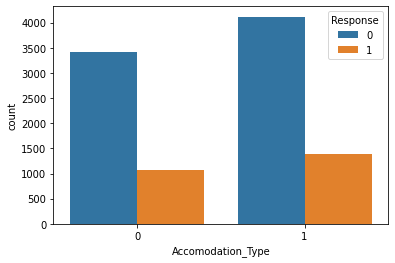

In [130]:
sns.countplot(final_df['Accomodation_Type'],hue=final_df['Response'])

#### Let's see the city-wise accomodation type and customer response

In [131]:
pd.set_option('display.max_rows',None)

pd.crosstab(final_df['Response'],columns=[final_df['City_Code'],final_df['Accomodation_Type']]).T

Response                       0    1
City_Code Accomodation_Type          
C1        0                  442  141
          1                  908  305
C10       0                  151   48
          1                  107   29
C11       0                   81   31
          1                   85   34
C12       0                   71   21
          1                   58   18
C13       0                   74   26
          1                   64   29
C14       0                   71   24
          1                   46   12
C15       0                   92   31
          1                   89   27
C16       0                  106   24
          1                   65   24
C17       0                   84   16
          1                   79   32
C18       0                   51   13
          1                   52   11
C19       0                   40    9
          1                   90   29
C2        0                  494  159
          1                  625  227
C20       0                   76   21
          1                   62   20
C21       0                   47    9
          1                   59   21
C22       0                   37   16
          1                   34   15
C23       0                   46   18
          1                   48   11
C24       0                   33    9
          1                   66   21
C25       0                   30    8
          1                   18   10
C26       0                   34    9
          1                   34   12
C27       0                   14    7
          1                   30    6
C28       0                   11    4
          1                   26    6
C29       0                   32   11
          1                   23    5
C3        0                  331  100
          1                  409  126
C30       0                    3    1
          1                    5    3
C31       0                    2    0
          1                    2    0
C32       0                   13    2
          1                   12   12
C33       0                   30    8
          1                   11    5
C34       0                   11    3
          1                    4    7
C35       0                    2    0
          1                    0    1
C36       0                    1    1
          1                    9    1
C4        0                  256   73
          1                  291  107
C5        0                  124   44
          1                   75   21
C6        0                  146   58
          1                  115   42
C7        0                   87   23
          1                  214   66
C8        0                  138   45
          1                  147   41
C9        0                  162   55
          1                  156   55

<AxesSubplot:xlabel='City_Code,Accomodation_Type'>

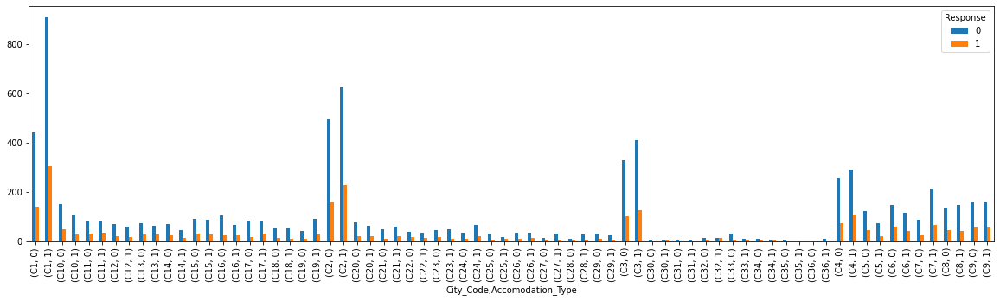

In [132]:
pd.crosstab(final_df['Response'],columns=[final_df['City_Code'],final_df['Accomodation_Type']]).T.plot(kind='bar',figsize=(20,5))

### Reco Insurance Type
#### Let's see the various recommended insurance types and customer response to them.

In [133]:
pd.crosstab(final_df['Reco_Insurance_Type'],final_df['Response'])

Response,0,1
Reco_Insurance_Type,,
0,1509,535
1,6032,1924


<AxesSubplot:xlabel='Reco_Insurance_Type', ylabel='count'>

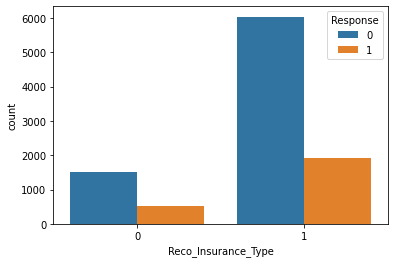

In [134]:
sns.countplot(final_df['Reco_Insurance_Type'],hue=final_df['Response'])

#### Let's see customers accommodation, recommended insurance type and customer responses.

In [135]:
pd.crosstab(index=[final_df['Accomodation_Type'],final_df['Reco_Insurance_Type']],columns=final_df['Response'])

Response                                  0    1
Accomodation_Type Reco_Insurance_Type           
0                 0                     380  139
                  1                    3043  929
1                 0                    1129  396
                  1                    2989  995

<AxesSubplot:xlabel='Accomodation_Type,Reco_Insurance_Type'>

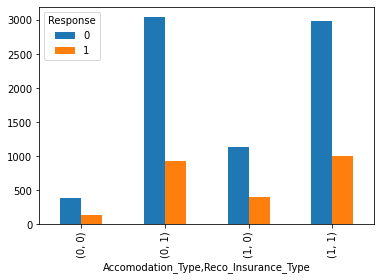

In [136]:
pd.crosstab(index=[final_df['Accomodation_Type'],final_df['Reco_Insurance_Type']],columns=final_df['Response']).plot(kind='bar')

### Recommended Policy Category
#### Let's see how many categories under the type of recommended policies.

In [137]:
print('Number of Recommended Policy Categories : ',final_df['Reco_Policy_Cat'].nunique())

Number of Recommended Policy Categories :  22


In [138]:
final_df['Reco_Policy_Cat'].unique()

array([16, 19, 17, 21,  9, 18, 13, 15, 14, 22, 20,  5, 12,  6,  4,  1,  3,
       11,  8,  2,  7, 10], dtype=int64)

<AxesSubplot:xlabel='Reco_Policy_Cat', ylabel='count'>

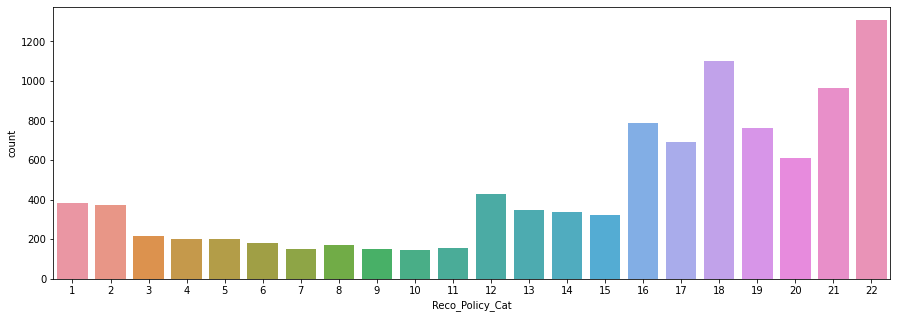

In [139]:
plt.figure(figsize=(15,5))
sns.countplot(final_df['Reco_Policy_Cat'])

### Recommended Policy Premium
#### Let's see if there is a relationship between the recommended policy premium and recommended policy category.Analyse results with customer's holding policy type and their response to recommended policy.

In [140]:
avg_premium=final_df.groupby(final_df['Reco_Policy_Cat'])[['Reco_Policy_Premium']].mean()
avg_premium

,Reco_Policy_Premium
Reco_Policy_Cat,
1,12915.944357
2,13231.982306
3,15390.644240
4,12157.566000
5,16142.542157
6,13193.164444
7,15231.881046
8,14319.471765
9,13699.385333


<AxesSubplot:xlabel='Reco_Policy_Cat'>

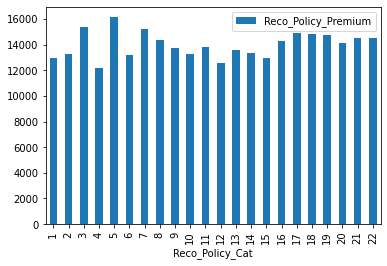

In [141]:
avg_premium.plot(kind='bar')

Text(0, 0.5, 'Average Recommended plocy premium')

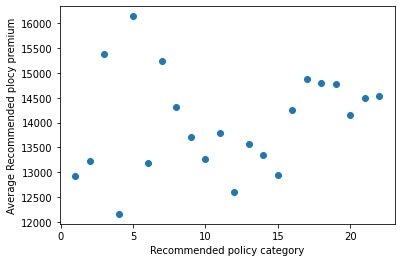

In [142]:
plt.scatter(avg_premium.index,avg_premium.values)
plt.xlabel('Recommended policy category')
plt.ylabel('Average Recommended plocy premium')

<AxesSubplot:xlabel='Reco_Policy_Cat'>

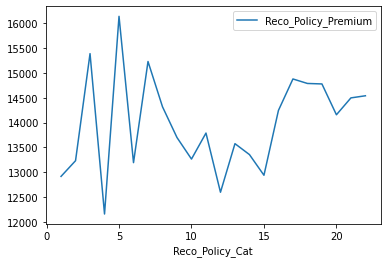

In [143]:
avg_premium.plot(kind='line')

In [144]:
pd.crosstab(final_df['Holding_Policy_Type'],final_df['Response'])

Response,0,1
Holding_Policy_Type,,
1.0,2067,647
2.0,1154,419
3.0,3295,1026
4.0,1025,367


<AxesSubplot:xlabel='Holding_Policy_Type'>

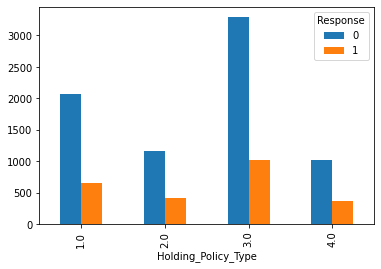

In [145]:
pd.crosstab(final_df['Holding_Policy_Type'],final_df['Response']).plot(kind='bar')

#### Let's see which type of recommnded policy has more number of customers

In [146]:
final_df['Reco_Policy_Cat'].value_counts()

22    1308
18    1102
21     966
16     786
19     764
17     694
20     612
12     431
1      381
2      373
13     348
14     336
15     323
3      217
5      204
4      200
6      180
8      170
11     155
7      153
9      150
10     147
Name: Reco_Policy_Cat, dtype: int64

In [147]:
print('Recommended policy category {} has more number of customers with {}'.format(final_df['Reco_Policy_Cat'].value_counts().idxmax(),final_df['Reco_Policy_Cat'].value_counts().max()))

Recommended policy category 22 has more number of customers with 1308


#### Let's see city-wise recommended insurance types to customers and theirresponses to recommended policy.

In [148]:
pd.crosstab(index=[final_df['City_Code'],final_df['Reco_Insurance_Type']],columns=final_df['Response'])

Response                         0    1
City_Code Reco_Insurance_Type          
C1        0                    354  116
          1                    996  330
C10       0                     37   25
          1                    221   52
C11       0                     39   12
          1                    127   53
C12       0                     29    7
          1                    100   32
C13       0                     22    8
          1                    116   47
C14       0                     15    3
          1                    102   33
C15       0                     44   12
          1                    137   46
C16       0                     40   11
          1                    131   37
C17       0                     26   12
          1                    137   36
C18       0                     19    5
          1                     84   19
C19       0                     26    9
          1                    104   29
C2        0                    214   87
          1                    905  299
C20       0                     20    7
          1                    118   34
C21       0                     21    3
          1                     85   27
C22       0                     11    5
          1                     60   26
C23       0                     13    4
          1                     81   25
C24       0                     17   12
          1                     82   18
C25       0                      7    5
          1                     41   13
C26       0                     19    3
          1                     49   18
C27       0                      7    2
          1                     37   11
C28       0                     12    3
          1                     25    7
C29       0                     10    1
          1                     45   15
C3        0                    142   47
          1                    598  179
C30       0                      2    2
          1                      6    2
C31       1                      4    0
C32       0                      5    4
          1                     20   10
C33       0                      7    4
          1                     34    9
C34       0                      4    3
          1                     11    7
C35       0                      1    0
          1                      1    1
C36       0                      0    1
          1                     10    1
C4        0                     82   28
          1                    465  152
C5        0                     30   15
          1                    169   50
C6        0                     41   17
          1                    220   83
C7        0                     81   29
          1                    220   60
C8        0                     60   12
          1                    225   74
C9        0                     52   21
          1                    266   89

<AxesSubplot:xlabel='City_Code,Reco_Insurance_Type'>

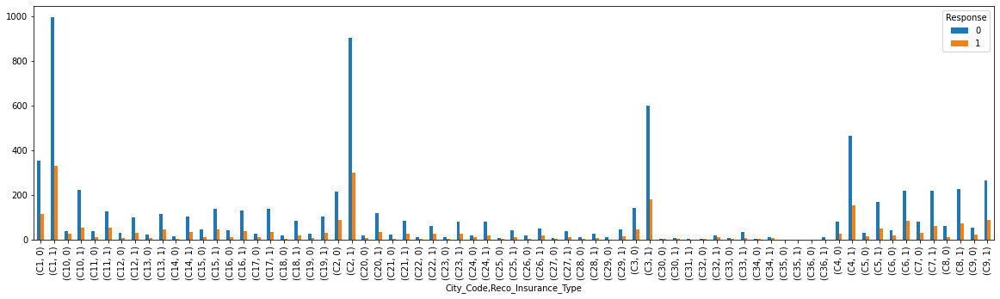

In [149]:
pd.crosstab(columns=final_df['Response'],index=[final_df['City_Code'],final_df['Reco_Insurance_Type']]).plot(kind='bar',figsize=(20,5))

#### Let's analyze the customer's upper age with their type of accommodation and recommended policy types to them and also their interest in the recommended policy.


In [150]:
pd.crosstab(final_df['Accomodation_Type'],final_df['Upper_Age'])

Upper_Age,18,19,20,21,22,23,24,25,26,27,...,66,67,68,69,70,71,72,73,74,75
Accomodation_Type,,,,,,,,,,,,,,,,,,,,,
0,24,101,129,221,240,247,252,240,201,173,...,32,24,26,23,28,16,25,17,15,109
1,5,12,21,31,56,59,64,70,88,79,...,106,109,80,97,106,102,74,85,70,441


<AxesSubplot:xlabel='Upper_Age', ylabel='count'>

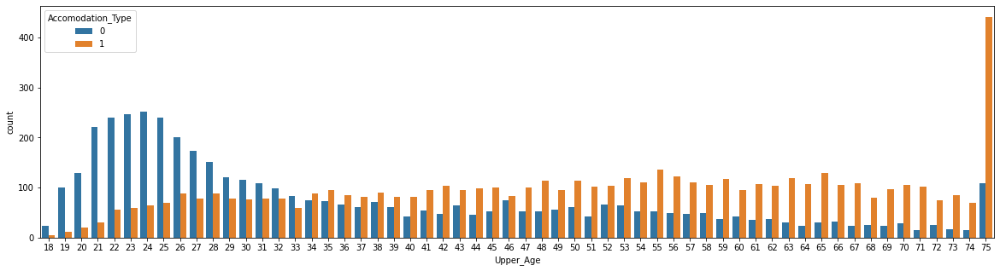

In [151]:
plt.figure(figsize=(20,5))
sns.countplot(final_df['Upper_Age'],hue=final_df['Accomodation_Type'])

In [152]:
pd.crosstab(final_df['Reco_Policy_Cat'],final_df['Upper_Age'])

Upper_Age,18,19,20,21,22,23,24,25,26,27,...,66,67,68,69,70,71,72,73,74,75
Reco_Policy_Cat,,,,,,,,,,,,,,,,,,,,,
1,0,2,7,8,10,16,12,9,6,14,...,2,4,1,2,4,2,2,3,2,18
2,8,5,5,9,11,16,11,9,10,6,...,3,1,1,2,6,1,3,1,1,16
3,0,0,4,5,5,9,4,8,2,4,...,1,5,3,5,0,0,4,1,7,14
4,0,2,3,10,12,5,9,10,8,2,...,2,1,2,3,1,1,0,2,1,4
5,0,2,0,1,1,5,6,7,3,8,...,3,4,4,5,5,7,0,5,3,21
6,0,6,5,9,6,6,8,3,4,2,...,0,1,1,1,0,4,0,2,1,8
7,0,2,0,1,6,5,3,3,5,2,...,5,7,2,1,1,2,4,3,6,12
8,0,0,5,3,9,8,4,5,5,3,...,4,2,4,2,3,4,0,0,2,10
9,0,0,3,4,5,5,6,4,4,7,...,2,1,1,2,1,0,2,1,1,4


In [153]:
pd.crosstab(final_df['Response'],final_df['Upper_Age'])

Upper_Age,18,19,20,21,22,23,24,25,26,27,...,66,67,68,69,70,71,72,73,74,75
Response,,,,,,,,,,,,,,,,,,,,,
0,24,91,116,192,232,240,243,230,217,189,...,96,103,80,82,97,88,81,73,74,413
1,5,22,34,60,64,66,73,80,72,63,...,42,30,26,38,37,30,18,29,11,137


<AxesSubplot:xlabel='Upper_Age', ylabel='count'>

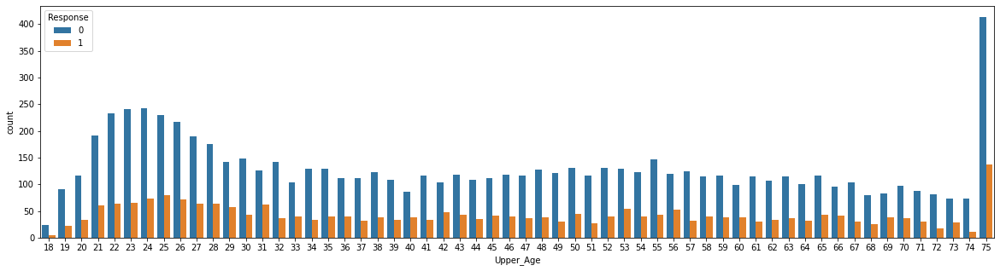

In [154]:
plt.figure(figsize=(20,5))
sns.countplot(final_df['Upper_Age'],hue=final_df['Response'])

#### Let's see city-wise the customers who have recommended to take the joint policy with their spouse or with other customers. Check these results with the customer's type of accommodation.

In [155]:
final_df[final_df['Reco_Insurance_Type']==0]['City_Code'].value_counts()

C1     470
C2     301
C3     189
C4     110
C7     110
C9      73
C8      72
C10     62
C6      58
C15     56
C16     51
C11     51
C5      45
C17     38
C12     36
C19     35
C13     30
C24     29
C20     27
C21     24
C18     24
C26     22
C14     18
C23     17
C22     16
C28     15
C25     12
C33     11
C29     11
C27      9
C32      9
C34      7
C30      4
C36      1
C35      1
Name: City_Code, dtype: int64

In [156]:
pd.crosstab(final_df[final_df['Reco_Insurance_Type']==0]['Response'],final_df[final_df['Reco_Insurance_Type']==0]['City_Code'])

City_Code,C1,C10,C11,C12,C13,C14,C15,C16,C17,C18,...,C33,C34,C35,C36,C4,C5,C6,C7,C8,C9
Response,,,,,,,,,,,,,,,,,,,,,
0,354,37,39,29,22,15,44,40,26,19,...,7,4,1,0,82,30,41,81,60,52
1,116,25,12,7,8,3,12,11,12,5,...,4,3,0,1,28,15,17,29,12,21


<AxesSubplot:xlabel='City_Code'>

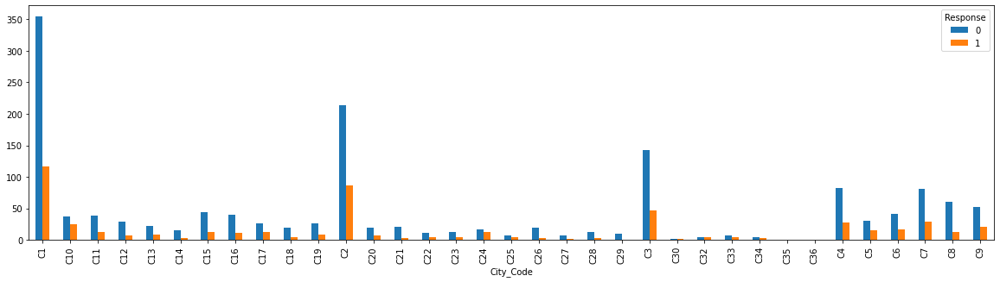

In [157]:
pd.crosstab(final_df[final_df['Reco_Insurance_Type']==0]['City_Code'],
            final_df[final_df['Reco_Insurance_Type']==0]['Response']).plot(kind='bar',figsize=(20,5))